In [1]:
%load_ext autoreload
%autoreload 2

### Run environment setup
import os
from os.path import join
from bertopic import BERTopic
from bertopic.vectorizers import ClassTfidfTransformer
from bertopic.dimensionality import BaseDimensionalityReduction
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.feature_extraction.text import CountVectorizer

/usr/local/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2023-04-02 16:42:35.918699: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-02 16:42:36.525175: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-04-02 16:42:36.525243: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
### Import general utilities for notebook
from lib.BBData import character_dict, random_state, model_name
from lib.BBDataLoad import load_char_df, get_chatbot_predictions
from lib.metrics.triplet_nn_classifier import BarneyBotTripletClassifier
from lib.metrics.distil_bert_classifier import DistilBertClassifier
from lib.metrics.frequency import sentence_preprocess, FrequencyClassifier
from lib.visualizations.emotionsradar import EmotionsRadar

In [3]:
characters = list(character_dict.keys())
characters_noDefault = list(character_dict.keys())
characters_noDefault.remove('Default')
base_folder = os.getcwd()
data_folder = join(base_folder, 'Data', 'Characters')
model_folder = join(base_folder, 'models')
embedder_path = join(os.getcwd(), 'models', 'distilbert_embedder')
embedder_path = join(os.getcwd(), 'models', 'distilbert_embedder')
out_folder = os.getcwd().join('tmp')
figsize = (8, 8)

F_TRAIN_DistilBERT = False

# BERTopic clssifier

In [21]:
df = load_char_df('Barney', base_folder)
docs =  df['train']['response'] + df['test']['response'] + df['val']['response']
print(len(docs))
docs_prepr = docs
# docs_prepr = []
# y = []
# for d in docs:
#     snt_prp = sentence_preprocess(d)
#     if snt_prp[1]:
#         docs_prepr.append(snt_prp[0])
#         y.append(0)
# docs_prepr[:10]

In [4]:
topic_model= BERTopic(
        verbose=True
)
topics, probs = topic_model.fit_transform(docs)

Batches: 100%|██████████| 163/163 [00:27<00:00,  5.93it/s]
2023-04-02 13:21:13,907 - BERTopic - Transformed documents to Embeddings
2023-04-02 13:21:40,869 - BERTopic - Reduced dimensionality
2023-04-02 13:21:41,090 - BERTopic - Clustered reduced embeddings


In [5]:
topic_model.visualize_topics()

In [6]:
topic_model.visualize_documents(docs)

## Supervised Topic Modeling

In [4]:
def preprocess(data: tuple):
    Xs, ys = data
    Xs_prepr, ys_prepr = [], []
    for x, y in zip(Xs, ys):
        x_prepr, is_relevant = sentence_preprocess(x)
        if is_relevant:
            Xs_prepr.append(x_prepr)
            ys_prepr.append(y)
    return Xs_prepr, ys_prepr

In [5]:
F_GET_VALIDATION = False
F_PREPR = False

distilbert_model = DistilBertClassifier(embedder_path=embedder_path, use_cuda=False, from_pretrained=True, n_triplets_x_anchor=3)
X_train, y_train, X_val, y_val, X_test, y_test = distilbert_model.get_data(
    source_path = data_folder,
    val = False,
    verbose = False
)

if F_PREPR:
    X_train, y_train = preprocess((X_train, y_train))
    if F_GET_VALIDATION:
        X_val, y_val = preprocess((X_val, y_val))
    X_test, y_test   = preprocess((X_test, y_test))

In [6]:
empty_dimensionality_model = BaseDimensionalityReduction()
clf = LogisticRegression()
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
vectorizer_model = CountVectorizer(stop_words="english")

In [7]:
# topic_model= BERTopic(
#         umap_model=empty_dimensionality_model,
#         hdbscan_model=clf,
#         ctfidf_model=ctfidf_model,
#         verbose=True
# )
topic_model = BERTopic(embedding_model="paraphrase-MiniLM-L6-v2", 
                       hdbscan_model=clf,
                       vectorizer_model=vectorizer_model, 
                       verbose=True)


Batches: 100%|██████████| 258/258 [01:09<00:00,  3.73it/s]
2023-04-02 16:45:08,663 - BERTopic - Transformed documents to Embeddings
2023-04-02 16:45:34,354 - BERTopic - Reduced dimensionality
2023-04-02 16:45:35,273 - BERTopic - Clustered reduced embeddings


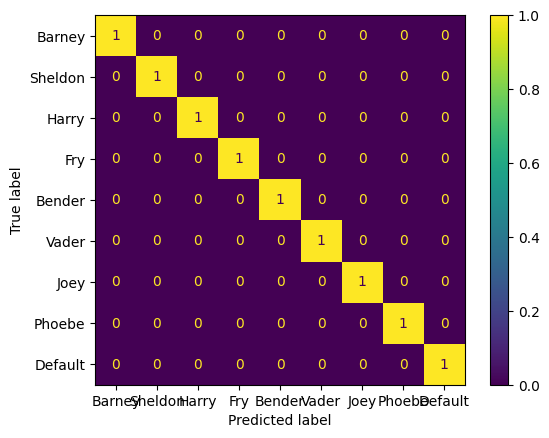

In [8]:
y_train_pred, probs = topic_model.fit_transform(X_train, y=y_train)
# The resulting topics may be a different mapping from the y labels. To map y to topics, we can run the following:
mappings = topic_model.topic_mapper_.get_mappings()
inv_map = {v: k for k, v in mappings.items()}
y_pred_mapped = [inv_map[val] for val in y_train_pred]
# plot confusion matrix
cm = confusion_matrix(y_true=y_train,
                      y_pred=y_pred_mapped,
                      labels=list(range(len(characters))),
                      normalize='pred')
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=characters)
disp.plot()

In [9]:
topic_model.visualize_documents(X_train)

Batches: 100%|██████████| 47/47 [00:22<00:00,  2.06it/s]
2023-04-02 16:48:02,841 - BERTopic - Reduced dimensionality
2023-04-02 16:48:02,844 - BERTopic - Predicted clusters


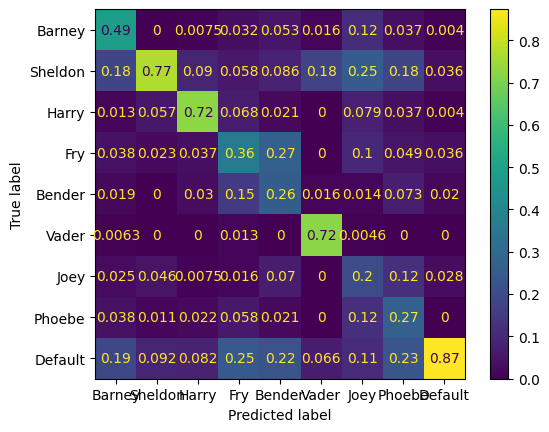

In [10]:
y_test_pred, probs = topic_model.transform(X_test)
# mappings = topic_model.topic_mapper_.get_mappings()
y_pred_mapped = [inv_map[val] for val in y_test_pred]
### compute confusion metrics of predictions/labels
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_pred_mapped,
                      labels=list(range(len(characters))),
                      normalize='pred')
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=characters)
disp.plot()